In [1]:
# https://github.com/fastai/course-v3/blob/master/nbs/dl1/lesson2-download.ipynb

In [18]:
from fastai import *
from fastai.vision import *
import os

``` javascript
urls = Array.from(document.querySelectorAll('.rg_di .rg_meta')).map(el=>JSON.parse(el.textContent).ou);
window.open('data:text/csv;charset=utf-8,' + escape(urls.join('\n')));
```

In [25]:
folder = 'taco_bell'
file = 'urls_taco_bell.txt'

In [28]:
folder = 'mcdonalds'
file = 'urls_mcdonalds.txt'

In [6]:
path = Path('../data')

In [7]:
path.ls()

[PosixPath('../data/urls_mcdonalds.txt'),
 PosixPath('../data/.ipynb_checkpoints'),
 PosixPath('../data/urls_taco_bell.txt')]

In [10]:
dest = path/folder
dest.mkdir(parents=True, exist_ok=True)

In [11]:
(path/folder).ls()

[]

In [13]:
?? download_images

In [29]:
download_images(path/file, path/folder, max_pics=200)

Error https://fm.cnbc.com/applications/cnbc.com/resources/img/editorial/2018/02/27/105032989-GettyImages-139040294.1910x1000.jpg 'content-length'
Error https://imagesvc.timeincapp.com/v3/mm/image?url=https%3A%2F%2Fcdn-image.foodandwine.com%2Fsites%2Fdefault%2Ffiles%2Fmcdonalds-quarter-pounder-fresh-beef-ft-blog0317.jpg&w=1000&c=sc&poi=face&q=70 'content-length'
Error https://parade.com/wp-content/uploads/2018/07/McDonalds-Fries-FTR.jpg 'content-length'
Error https://media.npr.org/assets/img/2018/02/14/gettyimages-865475902-20-a30b42488e09d852ad309f6e853bc5d404d41441-s800-c85.jpg 'content-length'
Error https://www.strategicmanagementinsight.com/swot-analyses/img/mcdonalds-swot-analysis.svg 'content-length'


In [14]:
file

'urls_taco_bell.txt'

In [23]:
path/file

PosixPath('../data/urls_taco_bell.txt')

In [24]:
path/folder

PosixPath('../data/taco_bell')

In [30]:
classes = ['mcdonalds', 'taco_bell']

In [31]:
for c in classes:
    print(c)
    verify_images(path/c, delete=True, max_workers=8)

mcdonalds


/home/edwin/anaconda3/lib/python3.6/site-packages/PIL/Image.py:916: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')
/home/edwin/anaconda3/lib/python3.6/site-packages/PIL/Image.py:916: UserWarning: Palette images with Transparency   expressed in bytes should be converted to RGBA images
  'to RGBA images')


cannot identify image file '/home/edwin/Developer/kaggle-comps/data/mcdonalds/00000034.jpg'
cannot identify image file '/home/edwin/Developer/kaggle-comps/data/mcdonalds/00000038.jpg'
cannot identify image file '/home/edwin/Developer/kaggle-comps/data/mcdonalds/00000041.jpg'
cannot identify image file '/home/edwin/Developer/kaggle-comps/data/mcdonalds/00000056.jpg'
cannot identify image file '/home/edwin/Developer/kaggle-comps/data/mcdonalds/00000081.jpg'
cannot identify image file '/home/edwin/Developer/kaggle-comps/data/mcdonalds/00000086.jpg'
taco_bell


cannot identify image file '/home/edwin/Developer/kaggle-comps/data/taco_bell/00000037.jpg'
cannot identify image file '/home/edwin/Developer/kaggle-comps/data/taco_bell/00000065.jpg'
cannot identify image file '/home/edwin/Developer/kaggle-comps/data/taco_bell/00000063.jpg'
cannot identify image file '/home/edwin/Developer/kaggle-comps/data/taco_bell/00000072.jpg'
cannot identify image file '/home/edwin/Developer/kaggle-comps/data/taco_bell/00000039.jpg'
cannot identify image file '/home/edwin/Developer/kaggle-comps/data/taco_bell/00000033.jpg'
cannot identify image file '/home/edwin/Developer/kaggle-comps/data/taco_bell/00000006.jpg'


In [32]:
np.random.seed(42)

In [33]:
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2, ds_tfms=get_transforms(), size=224, num_workers=4).normalize(imagenet_stats)

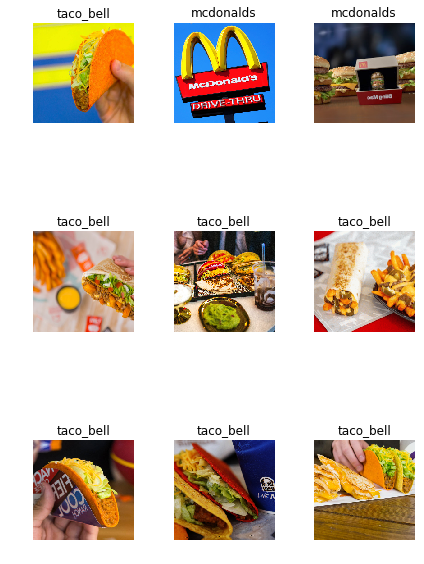

In [34]:
data.show_batch(rows=3, figsize=(6,9))

In [36]:
data.classes, data.c, len(data.train_ds), len(data.valid_ds)

(['mcdonalds', 'taco_bell'], 2, 136, 43)

In [37]:
learn = create_cnn(data, models.resnet34, metrics=error_rate)

In [39]:
learn.fit_one_cycle(4)

Total time: 00:32
epoch  train_loss  valid_loss  error_rate
1      0.352847    0.224418    0.069767    (00:08)
2      0.277653    0.178668    0.069767    (00:08)
3      0.198363    0.166352    0.093023    (00:07)
4      0.157073    0.160676    0.093023    (00:08)



In [41]:
! pwd

/home/edwin/Developer/kaggle-comps/nbs


In [42]:
learn.save('/home/edwin/Developer/kaggle-comps/tmp/stage_1.pth')

In [43]:
learn.unfreeze()

In [45]:
learn.lr_find()

LR Finder complete, type {learner_name}.recorder.plot() to see the graph.


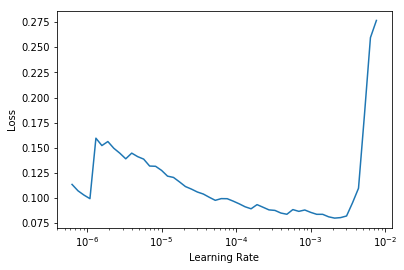

In [46]:
learn.recorder.plot()

In [47]:
learn.fit_one_cycle(2, max_lr=slice(3e-5, 3e-4))

Total time: 00:17
epoch  train_loss  valid_loss  error_rate
1      0.107947    0.192694    0.069767    (00:08)
2      0.174551    0.197603    0.069767    (00:09)



In [48]:
interp = ClassificationInterpretation.from_learner(learn)

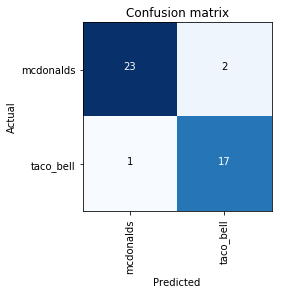

In [49]:
interp.plot_confusion_matrix()

In [50]:
from fastai.widgets import *

In [51]:
losses, idxs = interp.top_losses()

In [52]:
losses

tensor([2.8132e+00, 1.6994e+00, 1.6554e+00, 6.5846e-01, 6.5440e-01, 3.0319e-01,
        1.7486e-01, 1.4952e-01, 1.0478e-01, 4.3126e-02, 4.2702e-02, 3.6775e-02,
        3.4219e-02, 2.2615e-02, 2.1328e-02, 1.9253e-02, 1.8337e-02, 7.2640e-03,
        7.2563e-03, 6.2180e-03, 5.5559e-03, 2.8694e-03, 1.7089e-03, 1.6284e-03,
        1.5821e-03, 1.4443e-03, 1.3921e-03, 1.2970e-03, 1.2751e-03, 1.2105e-03,
        8.3447e-04, 6.9284e-04, 6.8760e-04, 6.6757e-04, 5.6005e-04, 3.2616e-04,
        2.8849e-04, 2.8753e-04, 1.3494e-04, 1.0252e-04, 4.0054e-05, 6.6757e-06,
        4.7684e-06])

In [53]:
top_loss_paths = data.valid_ds.x[idxs]

In [54]:
fd = FileDeleter(file_paths=top_loss_paths)

HBox(children=(VBox(children=(Image(value=b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x03\xb6\x00\x00\x02\x16\x08\x06\x00\x00\x00c\x91\x11\xc2\x00\x06\x8cgIDATx\x9c\xec\xbdw\xbc%\xc7Y\xe6\xff\xad\xeap\xf2\xcdi\xee\x9d\x9c\xa34\x92FY\xb2\x82e\xe3l\x19l\x83\x8d\r6\xd8\x86\xc5`\xd8\x05\xc3\xb2\xb0?0\x99]X\xc3.\xd9\x8b\x13\xeb\x80\xc1\x19\xcb\xb6,[V\x8eV\x9a\xd1\xe4\x1co\x8e\'ww\xd5\xef\x8f\x0e\xa7\xcf\xb9wF#iFi\xfa\x99\xcf\x9dsNwuu\xa8\xd0\xf5\xd4\xf3\xbeo\t@\x93 A\x82\x04/\x06D\xe3C\x03\x02\x11\xfb\xe1\x7f\x17Z\xa3t\xb07\xdc\x87Fk\x11&\x89:1\x11\xfe\x12\x02\xadA\x08\x8d\x16\xfeV\xa1A\x05\xe7\x12\x02tpFt\x90Gp-h\x8d\xd0~\x9eZ\x10|\x8fRG\'\x0b/Q\xbf\xcc{P!\xa2o\xfe\x87\x14\xc8\xa8\\\x04BH\xc2b!x\x1e\x00Jk\x84\x10~\xd9\x04\xdfEP.\x10>_\xff\x9bRa\xee~:\rh\xa5\xa3\xd3\x86\xd7\xa0u\xf0\x9f\x10\xc4\x8a:\xbaN\x1d\xec\xf3\x1f\xbeF\xabx\xd9\x9f\xf9e&\xa2\xff\xe2\xdb\xfc\x1b\xd3A\x1dh\xca#(\xec\xf0\x94\x84u"\xf8\x1d\xd6\x91\xe8\xf8\xd8\xc1\xba\xe9\x1cg\xb8\xae\x96\x9d\xa7\xcb\xe3\xb9"\xaa\xd2\xb1\xfcu\xecyF\xfbtsb\x11$\x10\xa2\xb5,\xfd6\xa7UX\x8e:\xa8#\xc1\xa1:h\x972<O\xd4\xaa\xa3|\x84\x10~9\x869j@6\xae6\xbe\xcfo\xe3\xb1\x8b\x8b\xca_\x07\xf7 \xa2\x9fa\xaa\xf8u\x85\xe9ut\x0f":\xce?\xb7&\xaa\xec\x80\x10\xb2q\xfe\xb0\x0e\x86uCJ@G\xdb\xa4\x14Q\xbf\x14\x9e\nMp\xef\xfe}J\x04*\xb8\x16\xddR\xa2\x02\x81\xa7T\xf0M\x07u+x\x9eA\xbdC4\x9e\x87\x0enR\x04\r\xd0O\x1f6\x80\xa0\x81\xaa\xb03\x8bN\xe2\xb7_\x00!\x11\xf8\xf7\xeb?W\xff\xb9H!\x82\xfeR7\x9eK\xb0\x8f\xd85EO0\xe8\xf8\xb4\x08\xd2\xab\xc6\xf5\x84\x8dD\x07e\xd5h\xc3\xb1r\x0b\xefG\xe9\xa0\x11i\xd0\x8a\x04\t\x12\\\xd80M\x13)\xe5\xf3\xce\xe7\x99\xc6\x02\t\x12$Hp\xde\xd0<\xd0\x8e\rH\xc3\xbeM\x8b\x804\x11\x1b\xf07H\xae\xd2\x1a)D\x83l\t\xfc\xc1d\xb0\x1d\x82\xfcE|\xa4\xd7 1^\xc0T\x84h\x0c\xdc\xa0Af\xc3!\xb9\xd6\xda\'\xb94\x06\xba\xd1`\xf6e\xde\x8bF\x97/\x02\xa2\x10\xb1\xd8\x90\x92\x08\xa4\x04\x84\x08\x8aEGe\xa6be"c\xcf\xa71\xc8\x15 }\x02\x1a\x8e\x8a#B\x18&\xa1Ad\xfdm\xe1\xa0\x99`\xb6! \x97\xb2\x91\xbf\xd2\xf3\xc9\xc2B\x13\x0c\xe24\x1b\xc2c\xc3s\xe8\xe8\xbaBR\xafQ\xc1\xa4\x07\x111\t\x07\xf9\xcd<0v+M\x04\xf8\x99\x10\x7f\xeeM\xe46\x96\xdfi\x8fy>h\xcc\xfd4\xe7\xd52C \xa5_\xf6\x11\xe1\t\x1e\xbe\x08&\x8d x\x1eR"\xb4\xdfZ\xfc\xb4A\x0b\x15"\x9a\xbc\x10Q\xe5\x88\xb5\xf7\x96\x9b\x8e8\x8f\x10\xc8x\xc9\xea\xc6\xfe(yp\xf1\xe1e\xa9X\x9f \x82\xeb\x08I\x9b\x02\x84V\x01\xc1m<\xdd\xb0n\x13\x90m!\xc3<\x1b\xf7\xac"\xc2\x1cN\xdc\x10=8\xa55\x86!\xfc\xfaC\xa3\xbf\x88&`Z\x88\xba\x90\xc2\x9f\x88\xd1\xca\'\x97\x08\x84\xd6>\xb9\x8e\x91\xf3\xe8\xbf\x96J\xa6\x95\x0e\xae\x8b\x88\x88\xfa\r\xebL\xb5B\xc4\xda\x91O`\x85\x11<y\x05H\xe1\xdf\x03\xa0T\xd0\xb7\xc9\xd8\xc3\xd6\xfe\xd3\rN\x1a=\x07\x82\xfb\x8dW\x19\xe5\xdf,a\xaf\xa1[\x1b\xa4V\x8d\xc9\xac(m\xacB\xbc\x9c;\xd1\x04\t\x12<g\x08!0\x0c\xe3\x9c\x90Zx\xd9\x0f\xc9\x12$H\xf0\x8a@\x13\x91\x02d4<\n\x06a""\xa7!\xb9\x89\xa0\x1b\xea\x13\xc4\x06\xec\r1%"F\x10\xa8\xb6\xba\xb1]\xc7z\xc1pP\x1a\xa9J\xe1`S4\x9f\xeb\xe5\xae\xd2\xce\x83h~\xf62\xce~b\x8a[\xa8\x88)\xdd\xf4\xc0\x82\xaf\xa1Z\xab\x03\xc2\xeb\xd3\x08\x89\x08\xe6\'B\xc5\xa71e\xd0 \x89~A)4\x92P\x8d\xf2\xb3\x0fU\xaf\xd6\xf1\xafn|\x898@k\xb1\x84\xdb\xa4h\xd4\x8bHY\x0b\xd5\xbe\x90\xb86\x11\xbb\x96J\xa5\xf5\x82\xe7\x88Or\xc4w\xc49\xc9\xb3\xa9*q\xd2|\xae\xabXXT\xa7\xcb;\xdenDpS!\xd9\xd3\xe1\xe4Bp\x91R\xc6&\x8db\x99)\xad\xfd\t\x88\x80\xecED?PFEL^\x8d\xca/P\xfd\xfc\xf3\x07D\x93\x98\xaa+\x1a\xc9|\x12\xa9\x9b\xdaaH\xbauL\xad\x0c\x9faH\xc2\xe2\xdb\xc3\xcc|\xd2\xabCF\x86@"\x8cX\xff"}b\x1e\x91U\x04Z+\x84\x10\x98\x86\xaf\xec\xaa\xa0\xbe\x1bR\xa2"\xe52\xb8\xfex\x9f\xa6UD\xfc#u4\xac\x98Z\x13Z\x1f\x84uF\xcd+\xa8`\xbf\x08\x0bJ\xc5\x14\xf1\xe6t-\xa5Jh^\xe0+\xb7A{6d\xd4)\n\xe1\xdf\xbbV*\x98\xbc\x13Q\xddW\xe1D\x8e\x8e\x91\x7f\xd5 \xba\xa1r\xafPA\xbb\x96\x84\x13\x91\xbez\xaf\x1b7\xe5\xc5\xfb\x0c\xaf\x85\xfc\xbe\xd2:\xd4\x04\t\x12\x9c-L\xd3\xc40\x8c\xf9\x93a\xcf\x11\t\xb1M\x90 \xc1\x8b\x8e8\x87\x88\x8dXc#\xbd\x06\xb1m\xed\xb1\xe2d <\xc4\x0b~\x87\xa3k\x1d\xd3j\xfcS\xb4\x10\xd7\x852;\r\xb1}\xa5"\xe2\x00\xb1\xc2\x88h\x86\x14M\xcf/|\x01\xc9\xc0$\x11\xed\x0f\x88U\xa4 \x11\x

Button(button_style='primary', description='Confirm', style=ButtonStyle())

In [55]:
data.classes

['mcdonalds', 'taco_bell']

In [56]:
data2 = ImageDataBunch.single_from_classes(path, data.classes, tfms=get_transforms(), size=224).normalize(imagenet_stats)

In [57]:
data2

In [61]:
learn = create_cnn(data2, models.resnet34)